In [1]:
!pip install opendatasets --upgrade --quiet

In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [10]:
# import opendatasets as od


# dataset_url = 'https://www.kaggle.com/splcher/animefacedataset'
# od.download(dataset_url)

Skipping, found downloaded files in "./animefacedataset" (use force=True to force download)


In [3]:
import os

DATA_DIR = "/kaggle/input/"
print(os.listdir(DATA_DIR))

['withoutmask-human-faces']


In [4]:
print(os.listdir(DATA_DIR + '/withoutmask-human-faces')[:10])

['seed9203.png', 'seed4059.png', 'seed1715.png', 'seed4049.png', 'seed6319.png', 'seed6838.png', 'seed4306.png', 'seed1252.png', 'seed6410.png', 'seed5555.png']


In [5]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [6]:
image_size = 64
batch_size = 64
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [7]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

In [8]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [9]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [10]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

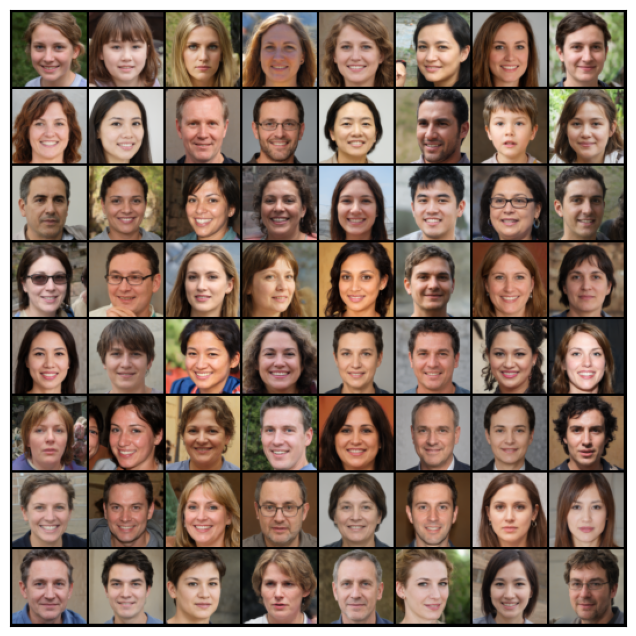

In [11]:
show_batch(train_dl)

In [12]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [13]:
device = get_default_device()
device

device(type='cuda')

In [14]:
train_dl = DeviceDataLoader(train_dl, device)

In [15]:
import torch.nn as nn

In [16]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [17]:
discriminator = to_device(discriminator, device)

In [18]:
latent_size = 128

In [19]:
discriminator = to_device(discriminator, device)

In [20]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([64, 3, 64, 64])


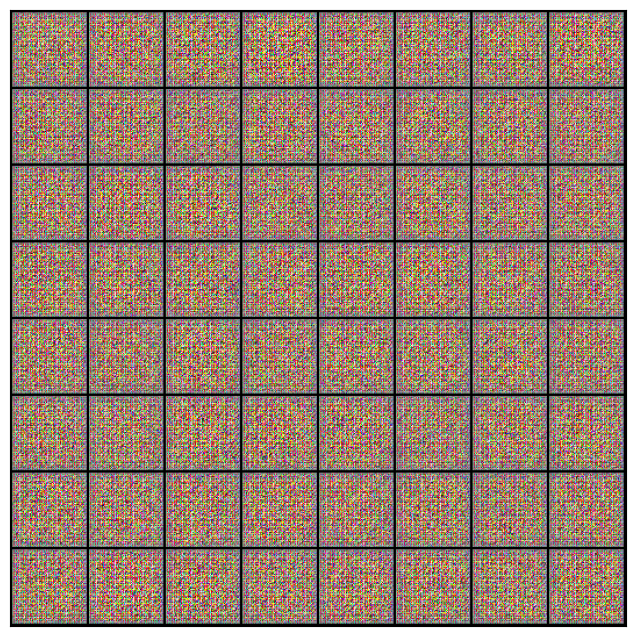

In [21]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [22]:
generator = to_device(generator, device)

In [23]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [24]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

In [25]:
from torchvision.utils import save_image

In [26]:
sample_dir = '/kaggle/working/generated'
os.makedirs(sample_dir, exist_ok=True)

In [27]:
print(f"Directory created at: {sample_dir}")

Directory created at: /kaggle/working/generated


In [28]:
def show_img(path):
    image_path = '/kaggle/working/generated/' + path
    img = mpimg.imread(image_path)

    plt.imshow(img)
    plt.axis('off')  # Turn off axis numbers and ticks
    plt.show()

In [29]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    show_img(fake_fname)
#     if show:
#         fig, ax = plt.subplots(figsize=(8, 8))
#         ax.set_xticks([]); ax.set_yticks([])
#         ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [30]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


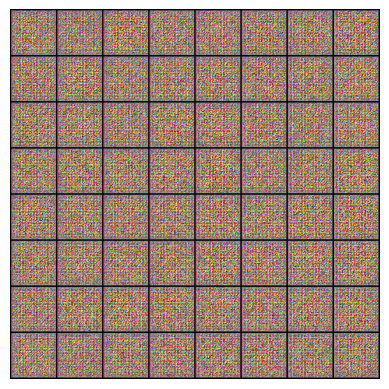

In [31]:
save_samples(0, fixed_latent)

In [32]:
print(os.listdir("/kaggle/working/"))



['generated', '.virtual_documents']


In [33]:
# List contents of the created directory

print(os.listdir('/kaggle/working/generated/'))

['generated-images-0000.png']


In [34]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [35]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

In [36]:
lr = 0.0001
epochs = 25

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [1/25], loss_g: 8.3201, loss_d: 0.0065, real_score: 0.9987, fake_score: 0.0051
Saving generated-images-0001.png


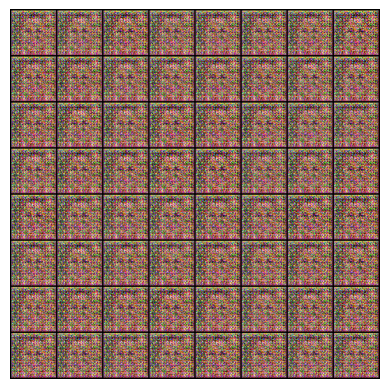

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [2/25], loss_g: 6.3040, loss_d: 0.0818, real_score: 0.9543, fake_score: 0.0252
Saving generated-images-0002.png


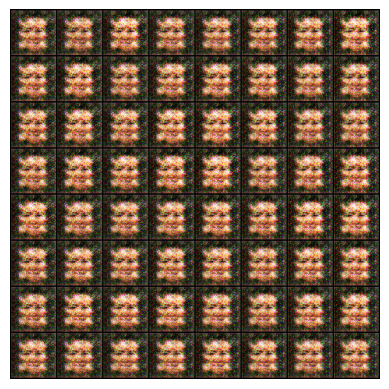

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [3/25], loss_g: 6.2703, loss_d: 0.0398, real_score: 0.9712, fake_score: 0.0092
Saving generated-images-0003.png


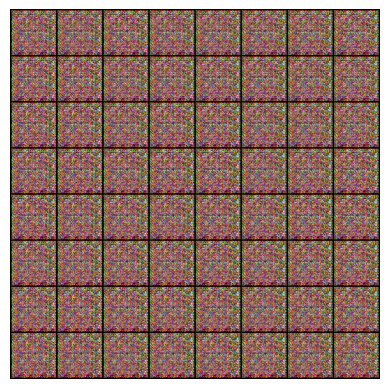

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [4/25], loss_g: 5.3333, loss_d: 0.0385, real_score: 0.9724, fake_score: 0.0101
Saving generated-images-0004.png


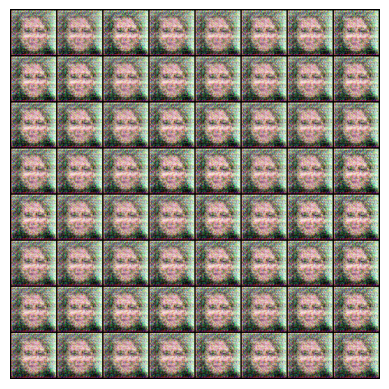

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [5/25], loss_g: 5.4220, loss_d: 0.0406, real_score: 0.9927, fake_score: 0.0326
Saving generated-images-0005.png


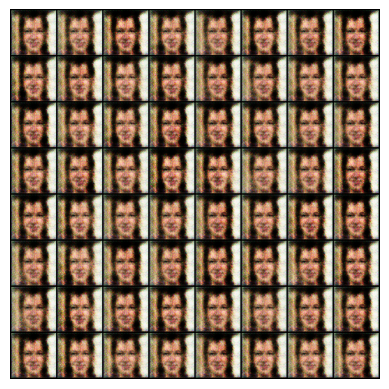

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [7/25], loss_g: 4.7232, loss_d: 0.1499, real_score: 0.9370, fake_score: 0.0732
Saving generated-images-0007.png


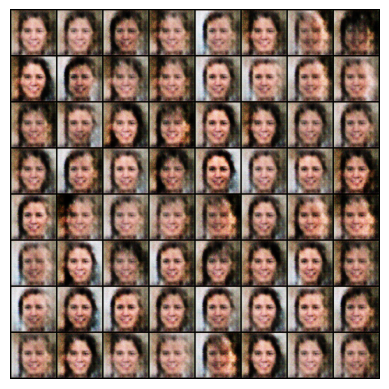

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [8/25], loss_g: 4.6683, loss_d: 0.1204, real_score: 0.9188, fake_score: 0.0277
Saving generated-images-0008.png


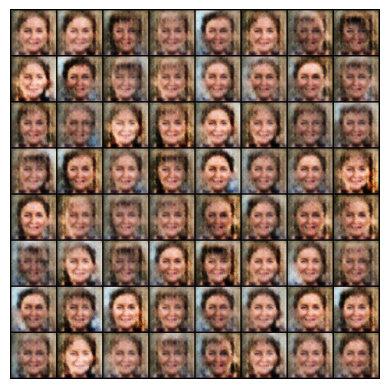

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [9/25], loss_g: 5.9914, loss_d: 0.1228, real_score: 0.9961, fake_score: 0.1068
Saving generated-images-0009.png


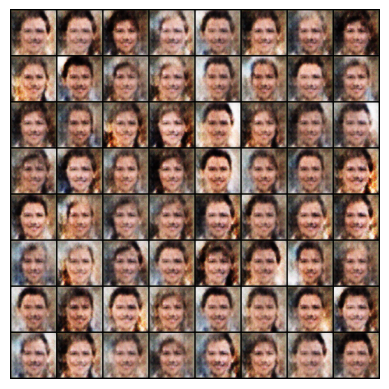

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [10/25], loss_g: 5.7626, loss_d: 0.2277, real_score: 0.9996, fake_score: 0.1640
Saving generated-images-0010.png


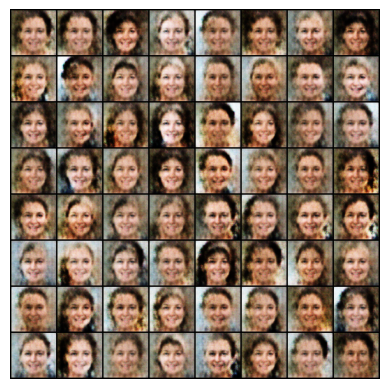

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [11/25], loss_g: 3.2960, loss_d: 0.2384, real_score: 0.8568, fake_score: 0.0129
Saving generated-images-0011.png


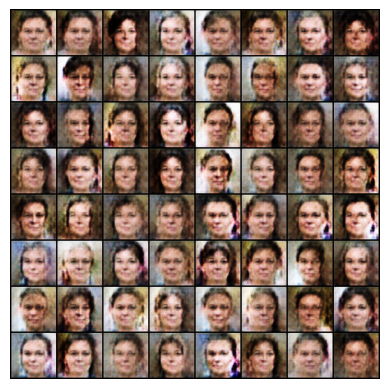

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [12/25], loss_g: 6.8932, loss_d: 0.5067, real_score: 0.9953, fake_score: 0.3217
Saving generated-images-0012.png


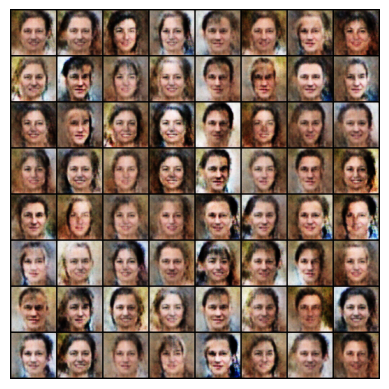

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [13/25], loss_g: 4.9674, loss_d: 0.1908, real_score: 0.9736, fake_score: 0.1436
Saving generated-images-0013.png


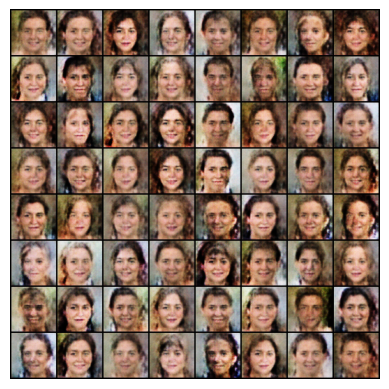

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [14/25], loss_g: 2.7518, loss_d: 0.6431, real_score: 0.7195, fake_score: 0.2007
Saving generated-images-0014.png


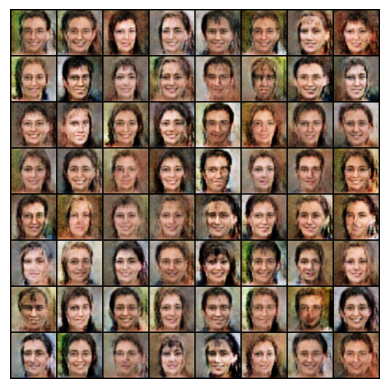

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [15/25], loss_g: 3.3238, loss_d: 0.0976, real_score: 0.9454, fake_score: 0.0360
Saving generated-images-0015.png


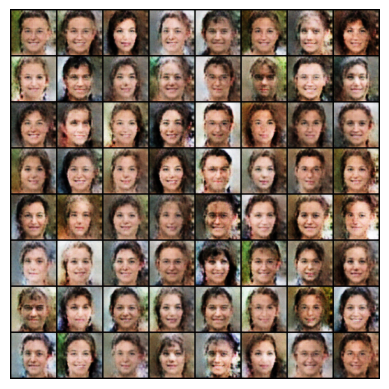

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [16/25], loss_g: 2.4150, loss_d: 0.2271, real_score: 0.9491, fake_score: 0.1392
Saving generated-images-0016.png


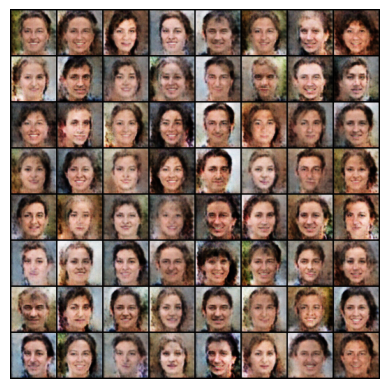

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [17/25], loss_g: 4.8483, loss_d: 0.2289, real_score: 0.9803, fake_score: 0.1761
Saving generated-images-0017.png


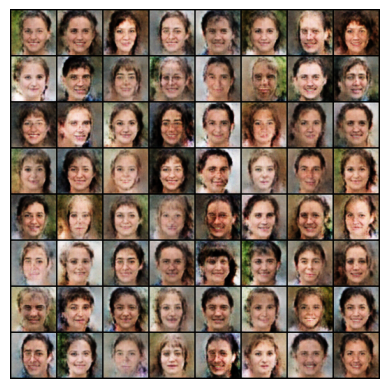

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [18/25], loss_g: 4.0156, loss_d: 0.1688, real_score: 0.9260, fake_score: 0.0761
Saving generated-images-0018.png


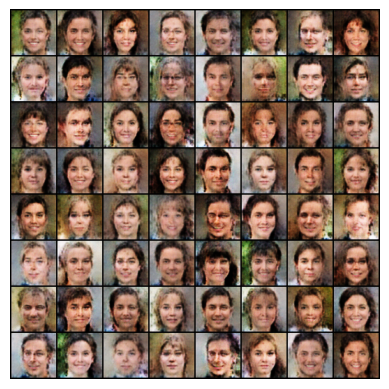

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [19/25], loss_g: 4.7254, loss_d: 0.0647, real_score: 0.9762, fake_score: 0.0388
Saving generated-images-0019.png


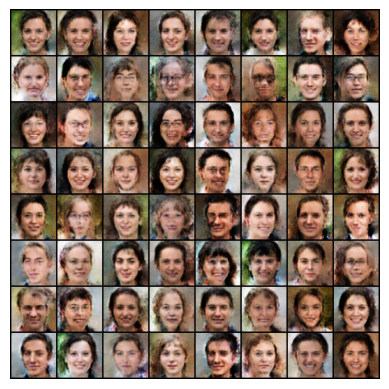

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [20/25], loss_g: 3.5132, loss_d: 0.1261, real_score: 0.9412, fake_score: 0.0572
Saving generated-images-0020.png


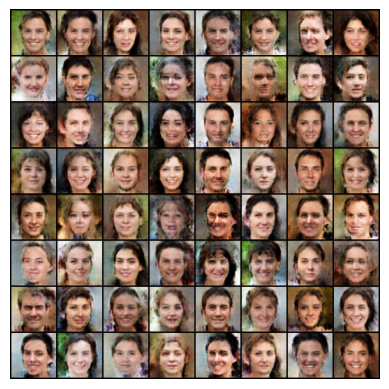

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [21/25], loss_g: 2.4604, loss_d: 0.2516, real_score: 0.8134, fake_score: 0.0174
Saving generated-images-0021.png


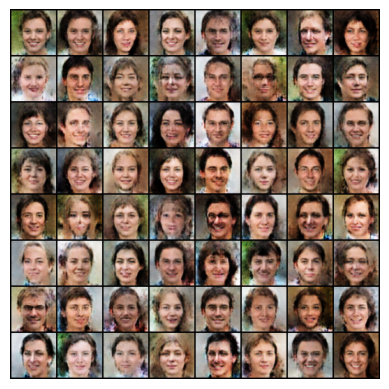

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [22/25], loss_g: 5.9492, loss_d: 0.1628, real_score: 0.8652, fake_score: 0.0039
Saving generated-images-0022.png


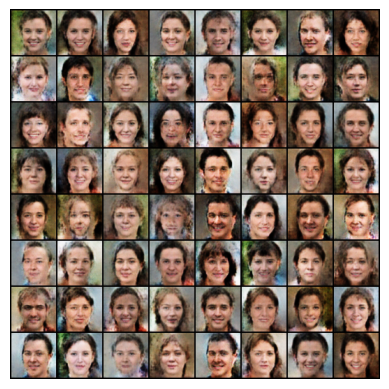

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [23/25], loss_g: 4.7816, loss_d: 0.1327, real_score: 0.9509, fake_score: 0.0746
Saving generated-images-0023.png


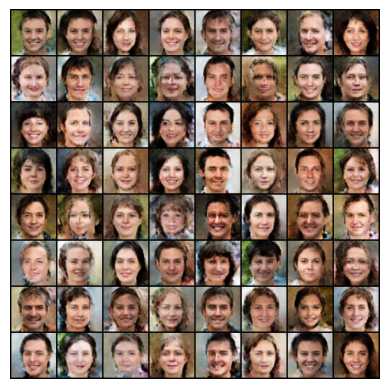

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [24/25], loss_g: 4.4881, loss_d: 0.1284, real_score: 0.9598, fake_score: 0.0803
Saving generated-images-0024.png


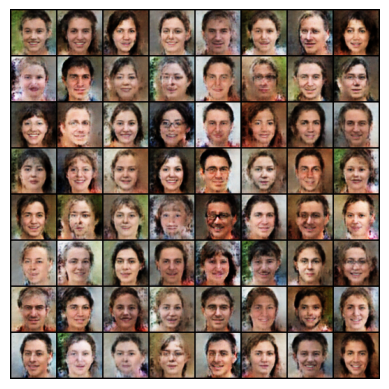

  0%|          | 0/157 [00:00<?, ?it/s]

Epoch [25/25], loss_g: 4.5654, loss_d: 0.0566, real_score: 0.9748, fake_score: 0.0298
Saving generated-images-0025.png


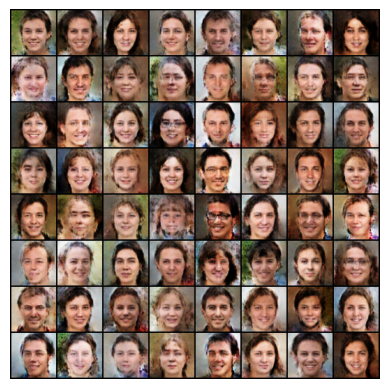

In [37]:
history = fit(epochs, lr)

history = fit(epochs, lr)

Saving test-generated-images-1.png
Saving test-generated-images-1.png
Saving test-generated-images-1.png
Saving test-generated-images-1.png
Saving test-generated-images-1.png
Saving test-generated-images-1.png
Saving test-generated-images-1.png
Saving test-generated-images-1.png
Saving test-generated-images-1.png
Saving test-generated-images-1.png


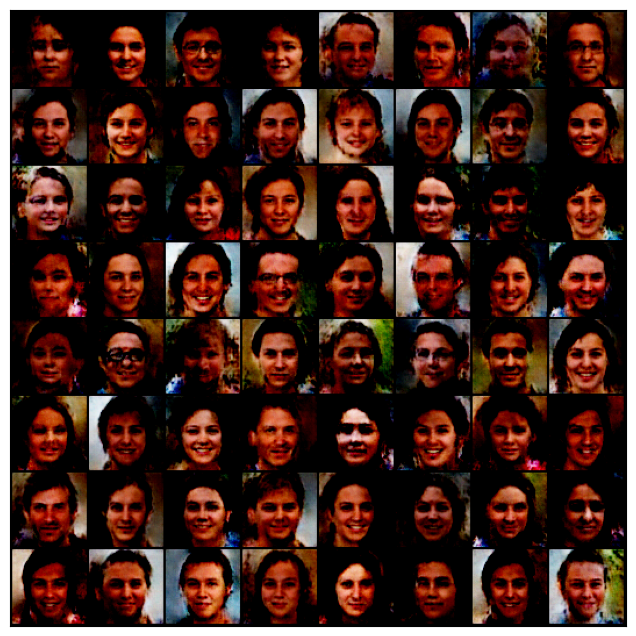

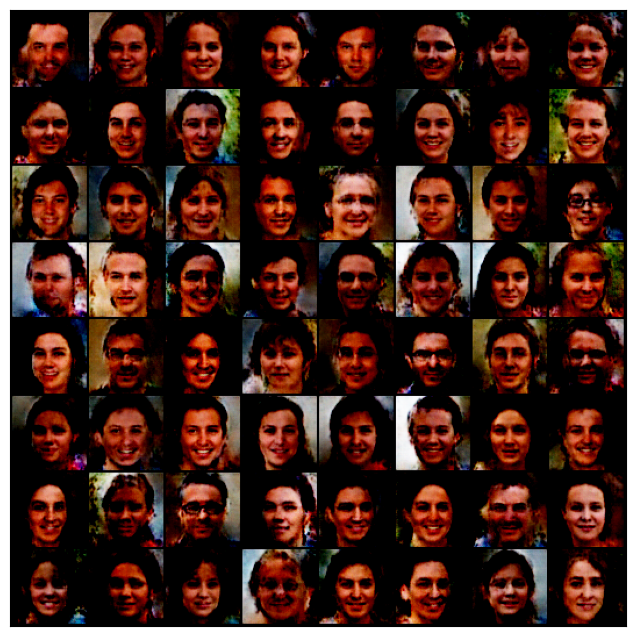

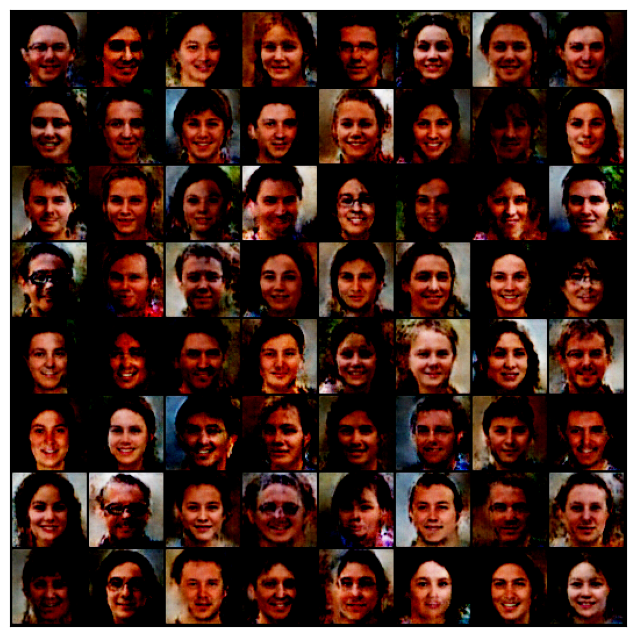

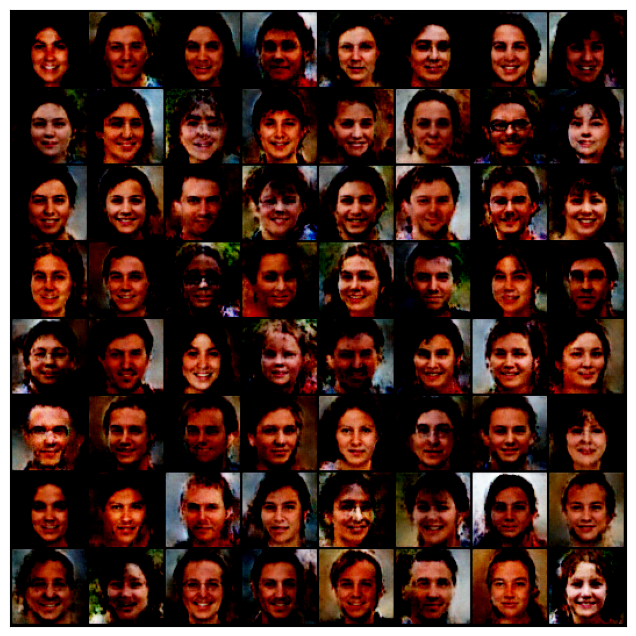

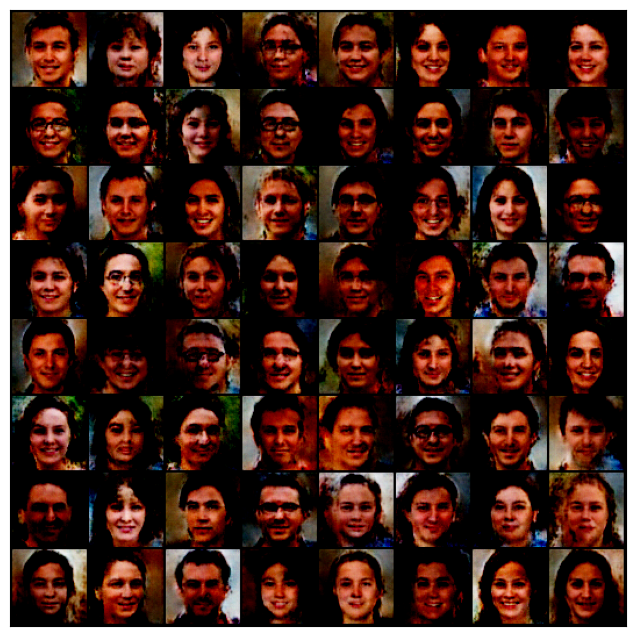

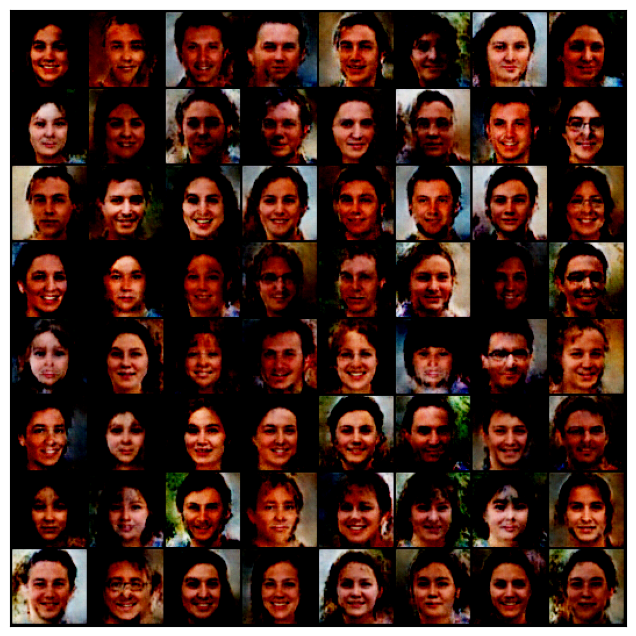

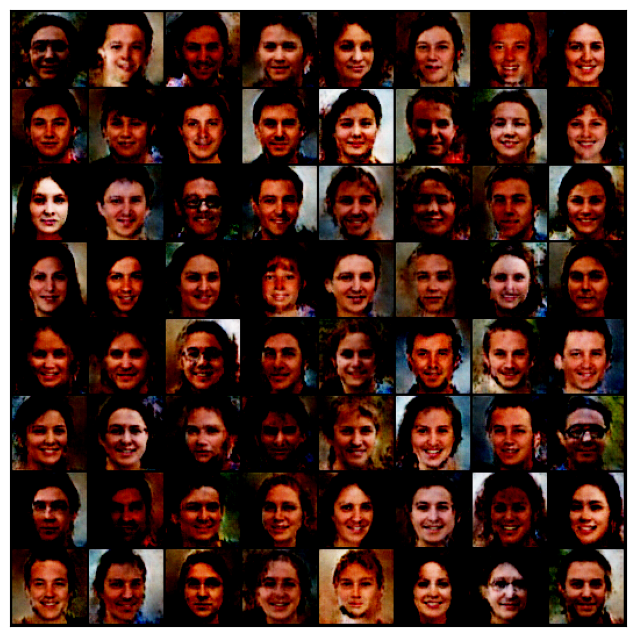

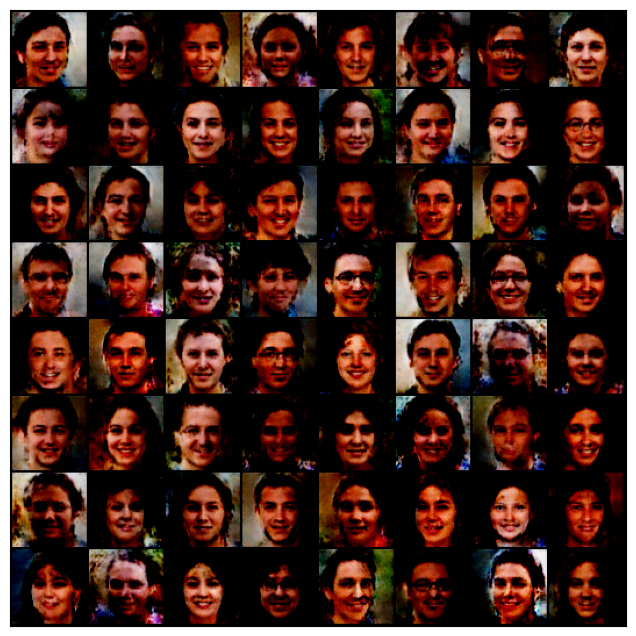

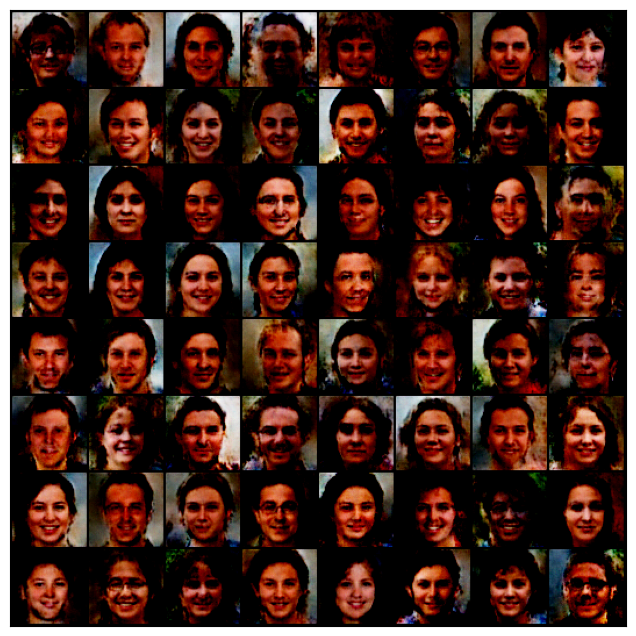

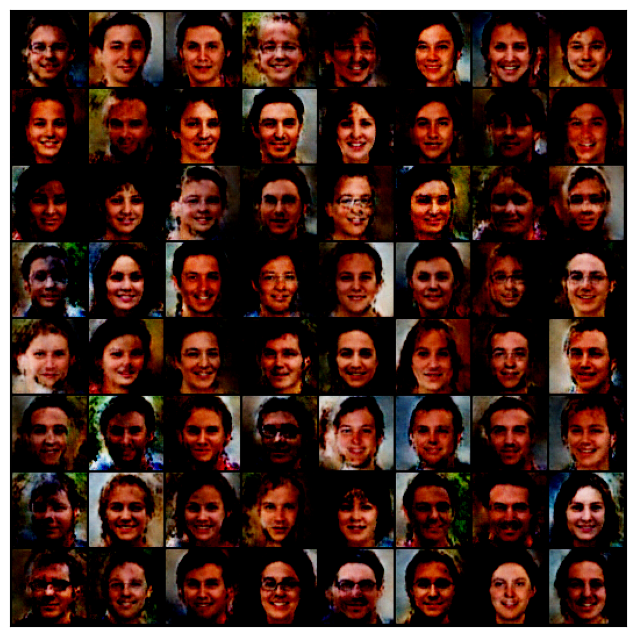

In [43]:
# temp_latent = torch.randn(64, latent_size, 1, 1, device=device)
for i in range(10):
    temp_latent = 2500 * torch.randn(64, latent_size, 1, 1, device=device)

    show = 1
    fake_images = generator(temp_latent)
    fake_fname = 'test-generated-images-1.png'
    temp_latent = torch.randn(64, latent_size, 1, 1, device=device)

    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [44]:
print(os.listdir("/kaggle/working/generated"))

['generated-images-0000.png', 'generated-images-0010.png', 'generated-images-0003.png', 'generated-images-0011.png', 'generated-images-0002.png', 'generated-images-0020.png', 'generated-images-0017.png', 'generated-images-0025.png', 'generated-images-0001.png', 'generated-images-0024.png', 'generated-images-0006.png', 'generated-images-0015.png', 'generated-images-0012.png', 'generated-images-0019.png', 'generated-images-0018.png', 'generated-images-0013.png', 'generated-images-0009.png', 'generated-images-0007.png', 'generated-images-0004.png', 'generated-images-0016.png', 'generated-images-0022.png', 'generated-images-0008.png', 'test-generated-images-1.png', 'generated-images-0005.png', 'generated-images-0021.png', 'generated-images-0014.png', 'generated-images-0023.png']


In [45]:
import cv2
import os

# Path to the folder containing images
input_folder = '/kaggle/working/generated'
output_video_path = 'GAN_Training_VIS_Humans.mp4'

# Get list of image filenames with .png extension and sort them
image_filenames = sorted([f for f in os.listdir(input_folder) if f.endswith('.png') and os.path.isfile(os.path.join(input_folder, f))])

# Check if there are any images
if not image_filenames:
    raise ValueError("No .png images found in the folder.")

# Read the first image to get the size (assuming all images are the same size)
first_image_path = os.path.join(input_folder, image_filenames[0])
frame = cv2.imread(first_image_path)
height, width, layers = frame.shape

# Define the codec and create a VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video = cv2.VideoWriter(output_video_path, fourcc, 1/0.2, (width, height))

# Loop through the images and write them to the video
for image_filename in image_filenames:
    image_path = os.path.join(input_folder, image_filename)
    frame = cv2.imread(image_path)
    video.write(frame)

# Release the VideoWriter object
video.release()

print(f'Video saved as {output_video_path}')


Video saved as GAN_Training_VIS_Humans.mp4


In [125]:
print(os.listdir("/kaggle/working/"))

['gans_training.mp4', 'discriminator.pth', 'GAN_Training_VIS.mp4', '.virtual_documents', 'animefacedataset', 'generated', 'Training_visualization.avi', 'gans_training.avi', 'generator.pth']


In [46]:
from IPython.display import Video

# Path to the video file
video_path = '/kaggle/working/GAN_Training_VIS_Humans.mp4'

# Display the video
Video(video_path)


In [54]:
import torch

# Assuming generator and discriminator are instances of torch.nn.Module
torch.save(generator.state_dict(), 'generator.pth')
torch.save(discriminator.state_dict(), 'discriminator.pth')

print('Models saved successfully.')


Models saved successfully.


In [53]:
from PIL import Image, ImageEnhance

# Load the image
image_path = '/kaggle/working/generated/test-generated-images-1.png'
image = Image.open(image_path)

# Reduce contrast
enhancer = ImageEnhance.Contrast(image)
reduced_contrast_image = enhancer.enhance(0.8)  # The factor 0.5 reduces the contrast; 1.0 means no change.

# # Save or display the reduced contrast image
# reduced_contrast_image.show()  # To display the image
reduced_contrast_image.save('reduced_contrast_image.png')  # To save the image
